In [194]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [196]:
df = pd.read_csv('Car_details_v3.csv')

In [198]:
df.sample(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6852,Maruti Swift Dzire ZDI,2015,590000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
4599,Honda City i VTEC V,2015,525000,120000,Petrol,Individual,Manual,Second Owner,17.4 kmpl,1497 CC,117.3 bhp,145Nm@ 4600rpm,5.0
5437,Chevrolet Spark 1.0 PS LPG,2007,100000,84000,LPG,Individual,Manual,Third Owner,16.0 km/kg,995 CC,60 bhp,88.4Nm@ 4200rpm,5.0
3502,Hyundai Elite i20 Magna Plus BSIV,2019,625000,12500,Petrol,Individual,Manual,First Owner,18.6 kmpl,1197 CC,81.86 bhp,117nm@ 4000rpm,5.0
1650,Tata Tiago 1.05 Revotorq XE,2017,325000,120000,Diesel,Individual,Manual,First Owner,27.28 kmpl,1047 CC,69 bhp,140Nm@ 1800-3000rpm,5.0


In [200]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   object 
 9   engine         7907 non-null   object 
 10  max_power      7913 non-null   object 
 11  torque         7906 non-null   object 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 825.6+ KB


In [202]:
df['Brand'] = df.iloc[:, 0].apply(lambda x: str(x).split()[0] if pd.notna(x) else "")

In [204]:
# df['Name'] = df['name'].apply(lambda x: "".join(x.split()[1:]) if pd.notna(x) else "")
df["model"] = df["name"].apply(lambda x: " ".join(x.split()[1:]))

In [206]:
df['model']

0                                     Swift Dzire VDI
1                              Rapid 1.5 TDI Ambition
2                                  City 2017-2020 EXi
3                                   i20 Sportz Diesel
4                                     Swift VXI BSIII
5                               Xcent 1.2 VTVT E Plus
6                               Wagon R LXI DUO BSIII
7                                         800 DX BSII
8                                           Etios VXD
9                     Figo Diesel Celebration Edition
10                            Duster 110PS Diesel RxL
11                                             Zen LX
12                                    Swift Dzire VDi
13                                      Swift 1.3 VXi
14                                  Wagon R LXI Minor
15                        KUV 100 mFALCON G80 K8 5str
16                                    Ertiga SHVS VDI
17                                  i20 1.4 CRDi Asta
18                          

In [208]:
df.drop(columns='name',axis=1,inplace=True)

In [209]:
df.isnull().sum()

year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          221
engine           221
max_power        215
torque           222
seats            221
Brand              0
model              0
dtype: int64

In [211]:
df.shape

(8128, 14)

In [212]:
df_new = df.copy()

In [214]:
df_new =df_new.dropna()

In [215]:
df_new.isnull().sum()

year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
torque           0
seats            0
Brand            0
model            0
dtype: int64

In [216]:
df_new.shape

(7906, 14)

In [217]:
df_new

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Brand,model
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII
5,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0,Hyundai,Xcent 1.2 VTVT E Plus
6,2007,96000,175000,LPG,Individual,Manual,First Owner,17.3 km/kg,1061 CC,57.5 bhp,"7.8@ 4,500(kgm@ rpm)",5.0,Maruti,Wagon R LXI DUO BSIII
7,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.1 kmpl,796 CC,37 bhp,59Nm@ 2500rpm,4.0,Maruti,800 DX BSII
8,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59 kmpl,1364 CC,67.1 bhp,170Nm@ 1800-2400rpm,5.0,Toyota,Etios VXD
9,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.0 kmpl,1399 CC,68.1 bhp,160Nm@ 2000rpm,5.0,Ford,Figo Diesel Celebration Edition


In [219]:
str(df_new.iloc[0,8]).split()[0]

'1248'

In [221]:
df_new['Engine_data'] = df_new.iloc[:, 8].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0")
df_new['Engine_CC'] = df_new.iloc[:, 8].apply(lambda x: str(x).split()[1] if pd.notna(x) and str(x).strip() else "NaN")

In [222]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Brand,model,Engine_data,Engine_CC
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC


In [223]:
df_new.drop(columns='engine',inplace=True)

In [224]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,max_power,torque,seats,Brand,model,Engine_data,Engine_CC
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC


In [225]:
df_new['Mileage_data'] = df_new['mileage'].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0").astype(float)
df_new['Mileage_unit'] = df_new['mileage'].apply(lambda x: str(x).split()[1] if pd.notna(x) and str(x).strip() else "NaN")

In [226]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,max_power,torque,seats,Brand,model,Engine_data,Engine_CC,Mileage_data,Mileage_unit
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC,23.40,kmpl
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC,21.14,kmpl
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC,17.70,kmpl
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC,23.00,kmpl
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC,16.10,kmpl


In [227]:
df_new.drop(columns='mileage',inplace=True)

In [229]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,max_power,torque,seats,Brand,model,Engine_data,Engine_CC,Mileage_data,Mileage_unit
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC,23.40,kmpl
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC,21.14,kmpl
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC,17.70,kmpl
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC,23.00,kmpl
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC,16.10,kmpl


In [231]:
df_new['Max_power'] = df_new['max_power'].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0")

In [232]:
df_new.drop(columns='max_power',inplace=True)

In [234]:
df_new['Mileage_data'] = df_new['Mileage_data'].astype(float)
df_new[ 'Max_power'] = df_new['Max_power'].astype(float)
df_new['Engine_data'] = df_new['Engine_data'].astype(float)

In [235]:
df_new.drop(columns='Engine_CC',inplace=True)

In [236]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,torque,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20


In [237]:
categorical_cols = df_new.select_dtypes(include=['object', 'category']).columns  # Select categorical columns

for col in categorical_cols:
    print(f"Value counts for column: {col}\n")
    print(df_new[col].value_counts(), "\n" + "-"*40 + "\n")  # Display counts for each unique value


Value counts for column: fuel

fuel
Diesel    4299
Petrol    3520
CNG         52
LPG         35
Name: count, dtype: int64 
----------------------------------------

Value counts for column: seller_type

seller_type
Individual          6563
Dealer              1107
Trustmark Dealer     236
Name: count, dtype: int64 
----------------------------------------

Value counts for column: transmission

transmission
Manual       6865
Automatic    1041
Name: count, dtype: int64 
----------------------------------------

Value counts for column: owner

owner
First Owner             5215
Second Owner            2016
Third Owner              510
Fourth & Above Owner     160
Test Drive Car             5
Name: count, dtype: int64 
----------------------------------------

Value counts for column: torque

torque
190Nm@ 2000rpm                 530
200Nm@ 1750rpm                 445
90Nm@ 3500rpm                  405
113Nm@ 4200rpm                 223
114Nm@ 4000rpm                 171
62Nm@ 3000rpm    

In [238]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
df_new['torque'].value_counts()

torque
190Nm@ 2000rpm                 530
200Nm@ 1750rpm                 445
90Nm@ 3500rpm                  405
113Nm@ 4200rpm                 223
114Nm@ 4000rpm                 171
62Nm@ 3000rpm                  164
69Nm@ 3500rpm                  141
160Nm@ 2000rpm                 138
330Nm@ 1600-2800rpm            122
74.5Nm@ 4000rpm                121
59Nm@ 2500rpm                  112
110Nm@ 4800rpm                 112
219.7Nm@ 1500-2750rpm          101
195Nm@ 1400-2200rpm            101
114.7Nm@ 4000rpm                97
400Nm@ 1750-2500rpm             96
20.4@ 1400-3400(kgm@ rpm)       82
72Nm@ 4386rpm                   78
290Nm@ 1800-2800rpm             76
259.9Nm@ 1900-2750rpm           75
114Nm@ 3500rpm                  75
140Nm@ 1800-3000rpm             73
250Nm@ 1500-2500rpm             73
113.75nm@ 4000rpm               72
115Nm@ 4000rpm                  72
205Nm@ 1750-3250rpm             68
320Nm@ 1700-2700rpm             66
259.8Nm@ 1900-2750rpm           65
430Nm@ 1750-2

In [239]:
df_new['Torque_NM'] = df_new['torque'].apply(lambda x: str(x).split()[0].replace('Nm', "").replace('NM', "").replace('nm', "").replace('@', "").replace('kgm', '') if pd.notna(x) and str(x).strip() else np.nan)
df_new['Torque_NM'] = df_new['Torque_NM'].str.extract(r'([\d.]+)')

In [240]:
# Regex pattern to match valid torque values and their respective rpm
valid_pattern = r"(\d+\.?\d*)\s*(nm|Nm)\s*@\s*\(?(\d+(-\d+)?)\)?\s*rpm"

# Function to handle and format the torque values
def handle_and_format_torque(value):
    # First, normalize the value by fixing common errors
    value = value.lower().replace('kgm', 'nm')  # Correct "kgm" to "nm"
    value = re.sub(r'\s+', ' ', value)  # Remove extra spaces
    value = value.replace(',', '')  # Remove commas
    value = re.sub(r'(\d)\s*-\s*(\d)', r'\1-\2', value)  # Ensure no spaces in rpm ranges
    value = re.sub(r'(\d)\s*(@)\s*(\d)', r'\1@ \3', value)  # Fix spacing around "@"

    # Check if the format is valid after normalization
    match = re.match(valid_pattern, value)
    if match:
        torque = match.group(1)
        rpm = match.group(3)

        # Return in the desired format
        if '-' in rpm:
            return f"{torque}Nm @ ({rpm})rpm"
        else:
            return f"{torque}Nm @ {rpm}rpm"
    
    # If still invalid, return the original value with an error message
    return f"Invalid format: {value}"

In [241]:
# Convert the torque values in the DataFrame column to the desired format
# df_new['Formated_tor'] = df_new['torque_values'].apply(format_torque_value)

In [242]:
# df_new['torque'].apply(handle_and_format_torque)

In [253]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,torque,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power,Torque_NM
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00,190
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52,250
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00,12.7
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00,22.4
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20,11.5


In [265]:
# df_new['Torque_RPM'] = df_new['torque'].apply(lambda x: str(x).split()[1].replace('rpm', "").replace('(', "").replace('@', "").replace('kgm', '').replace('+', '').replace('/', '').replace(',', '').replace('NM', '') if pd.notna(x) and len(str(x).split()) > 1 and str(x).strip() else np.nan)

In [266]:
# df_new['Torque_RPM'].value_counts()

In [268]:
# df["model"] = df["name"].apply(lambda x: " ".join(x.split()[1:]))
df_new[['torque_Nm', 'rpm']] = df_new['torque'].str.split(" ", n=1, expand=True)
# df1['torque_Nm'] = df1['torque_Nm'].str.extract(r'([\d.]+)')
df_new[['Min_rpm', 'Max_rpm']] = df_new['rpm'].str.extract(r'(\d+)-?(\d+)?')
df_new['Max_rpm'] = df_new['Max_rpm'].fillna(df_new['Min_rpm'])
df_new[["Min_rpm", "Max_rpm"]] = df_new[["Min_rpm", "Max_rpm"]].astype("float64")
df_new["RPM"] = (df_new['Min_rpm'] + df_new['Max_rpm'])/2

In [272]:
df_new['Torque_NM'] = df_new['Torque_NM'].astype("float64")

In [274]:
df_new.drop(columns=['torque_Nm', 'rpm', 'Min_rpm', 'Max_rpm'], inplace=True)

In [275]:
df_new.drop(columns=['torque'], inplace=True)

In [277]:
df_new.head(10)

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power,Torque_NM,RPM
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00,190.00,2000.0
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52,250.00,2000.0
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00,12.70,2.0
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00,22.40,2250.0
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20,11.50,4.0
5,2017,440000,45000,Petrol,Individual,Manual,First Owner,5.0,Hyundai,Xcent 1.2 VTVT E Plus,1197.0,20.14,kmpl,81.86,113.75,4000.0
6,2007,96000,175000,LPG,Individual,Manual,First Owner,5.0,Maruti,Wagon R LXI DUO BSIII,1061.0,17.30,km/kg,57.50,7.80,4.0
7,2001,45000,5000,Petrol,Individual,Manual,Second Owner,4.0,Maruti,800 DX BSII,796.0,16.10,kmpl,37.00,59.00,2500.0
8,2011,350000,90000,Diesel,Individual,Manual,First Owner,5.0,Toyota,Etios VXD,1364.0,23.59,kmpl,67.10,170.00,2100.0
9,2013,200000,169000,Diesel,Individual,Manual,First Owner,5.0,Ford,Figo Diesel Celebration Edition,1399.0,20.00,kmpl,68.10,160.00,2000.0


In [278]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7906 entries, 0 to 8127
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   year           7906 non-null   int64  
 1   selling_price  7906 non-null   int64  
 2   km_driven      7906 non-null   int64  
 3   fuel           7906 non-null   object 
 4   seller_type    7906 non-null   object 
 5   transmission   7906 non-null   object 
 6   owner          7906 non-null   object 
 7   seats          7906 non-null   float64
 8   Brand          7906 non-null   object 
 9   model          7906 non-null   object 
 10  Engine_data    7906 non-null   float64
 11  Mileage_data   7906 non-null   float64
 12  Mileage_unit   7906 non-null   object 
 13  Max_power      7906 non-null   float64
 14  Torque_NM      7906 non-null   float64
 15  RPM            7872 non-null   float64
dtypes: float64(6), int64(3), object(7)
memory usage: 1.0+ MB


In [279]:
df_new.shape

(7906, 16)

In [284]:
X = df_new.drop(columns='selling_price')
y = df_new['selling_price']

In [286]:
X.shape , y.shape

((7906, 15), (7906,))

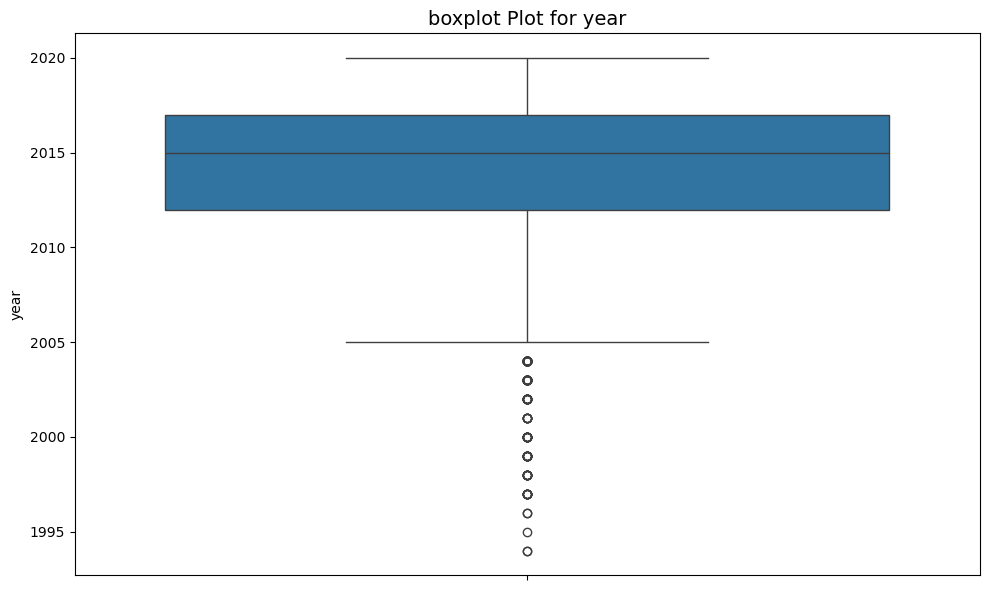

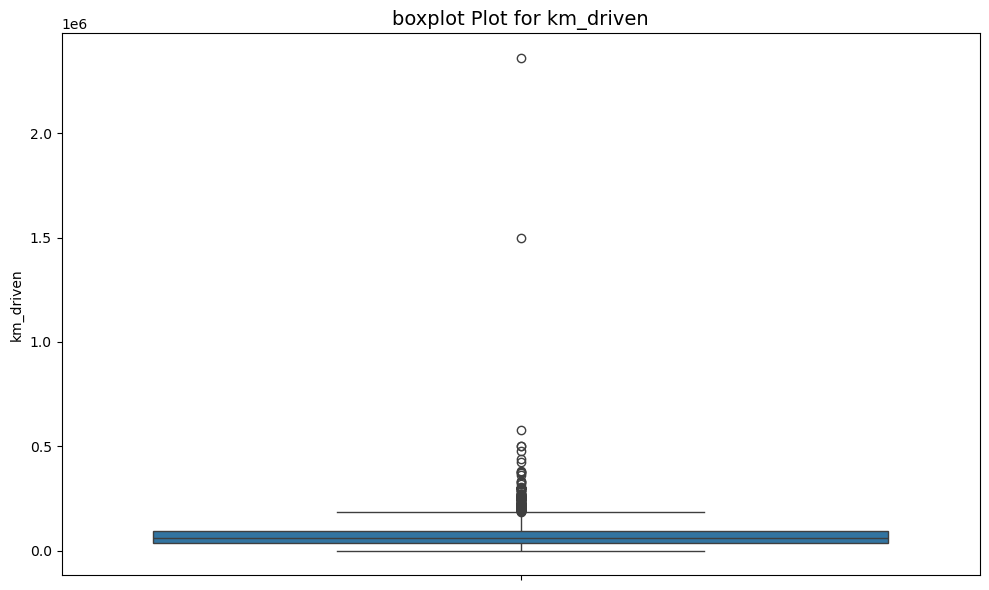

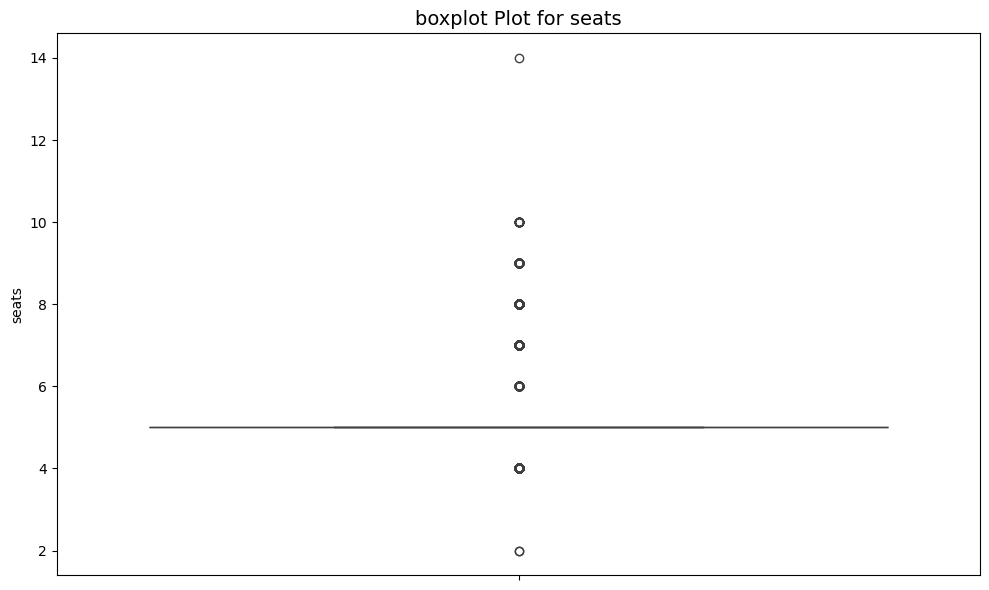

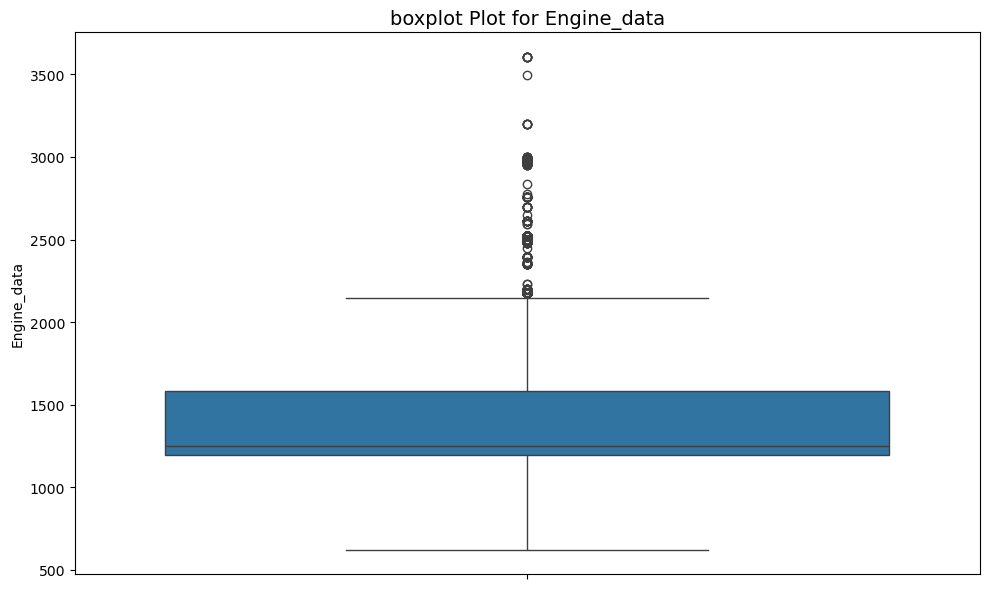

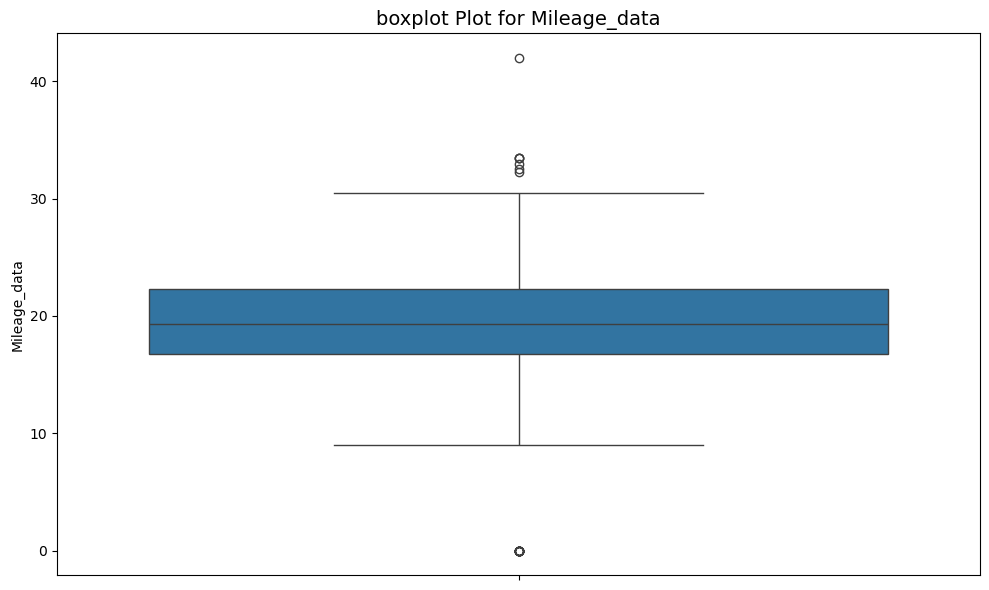

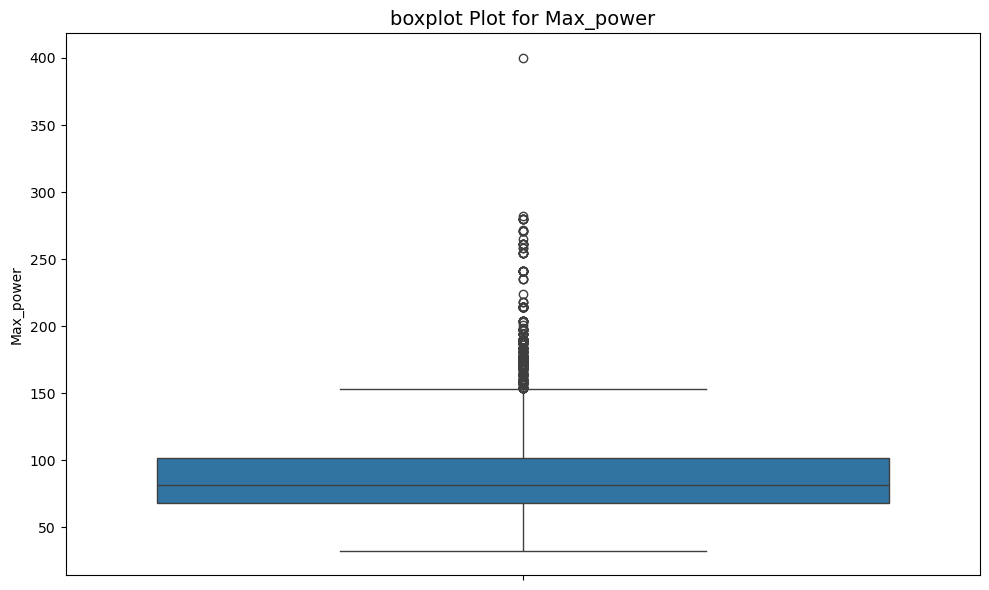

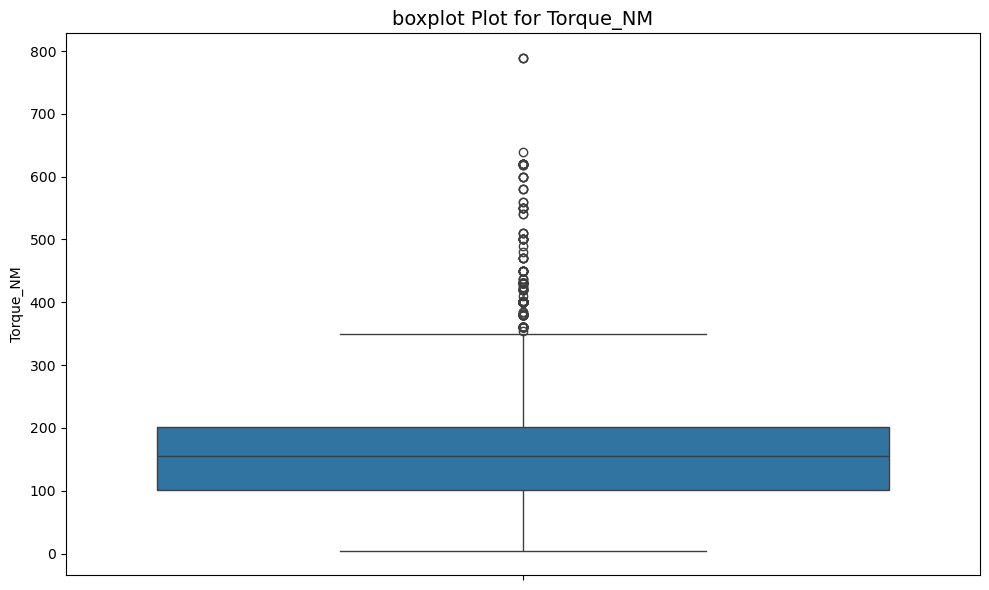

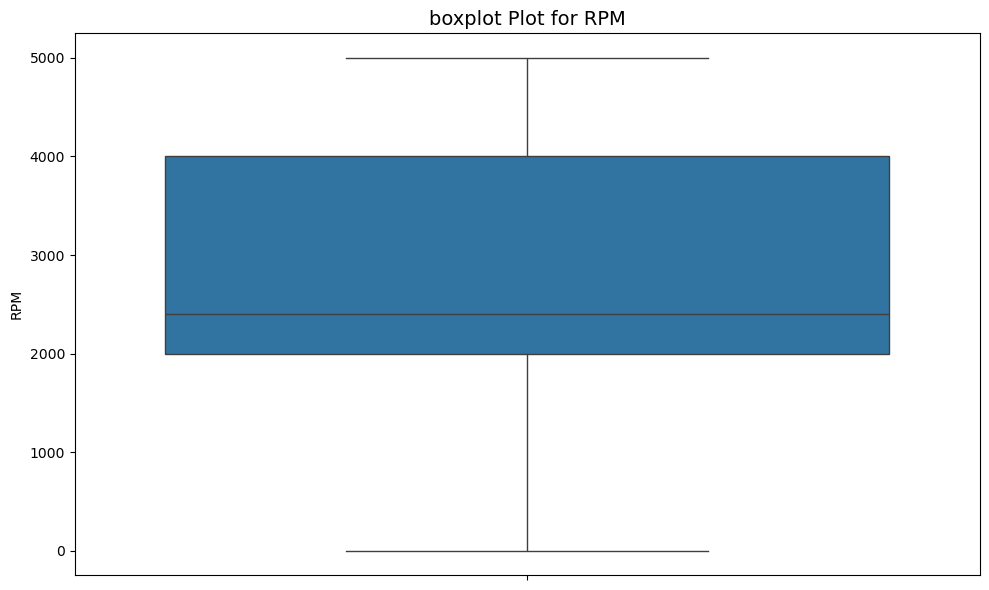

In [288]:
# Loop through each column in the DataFrame
for column in X.columns:
    if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [290]:
# Function to cap outliers using IQR
def cap_outliers_iqr(df):
    df_capped = df.copy()  # Make a copy to avoid modifying the original DataFrame

    # Loop through numeric columns and cap outliers based on IQR
    for column in df_capped.select_dtypes(include=[np.number]).columns:
        Q1 = df_capped[column].quantile(0.25)
        Q3 = df_capped[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Cap values outside the bounds to the lower or upper bound
        df_capped[column] = np.clip(df_capped[column], lower_bound, upper_bound)

    return df_capped

In [292]:
X = cap_outliers_iqr(X)

In [294]:
X.shape

(7906, 15)

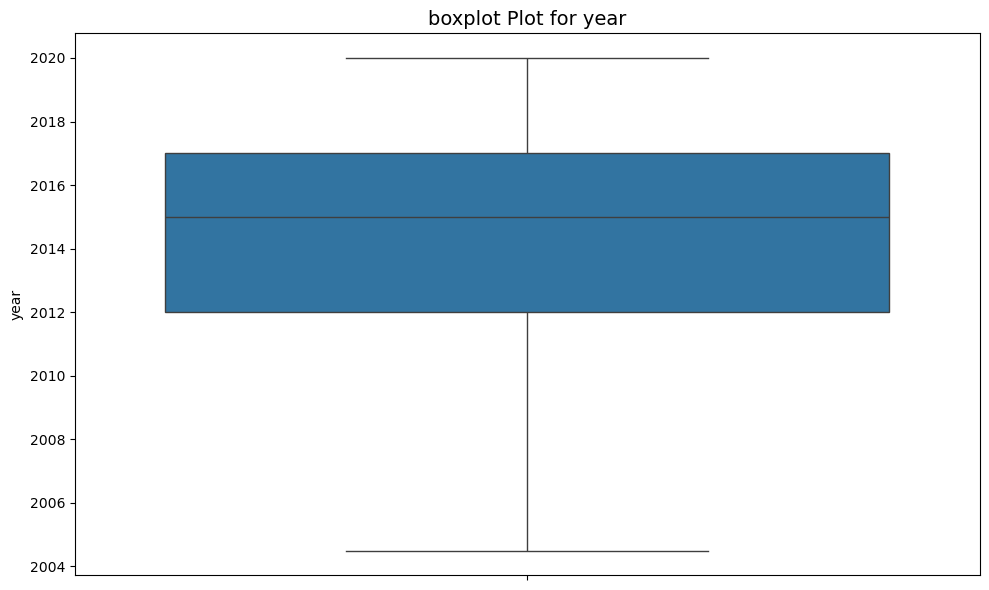

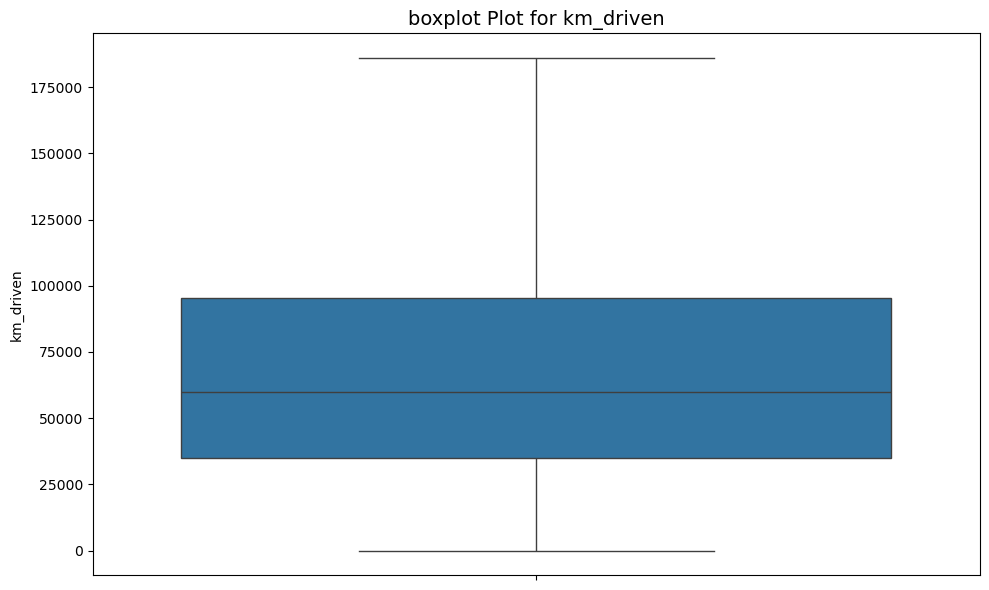

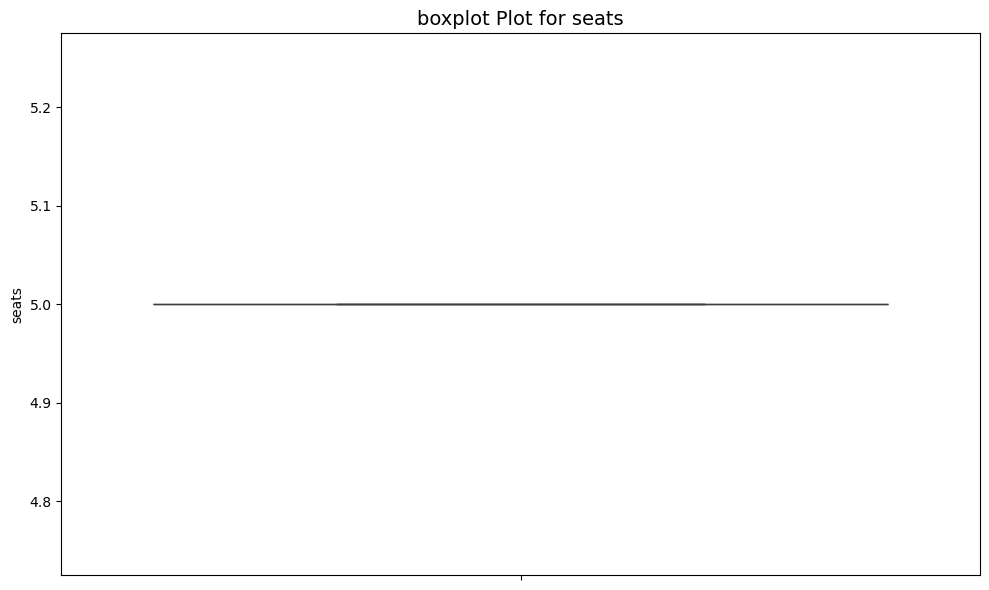

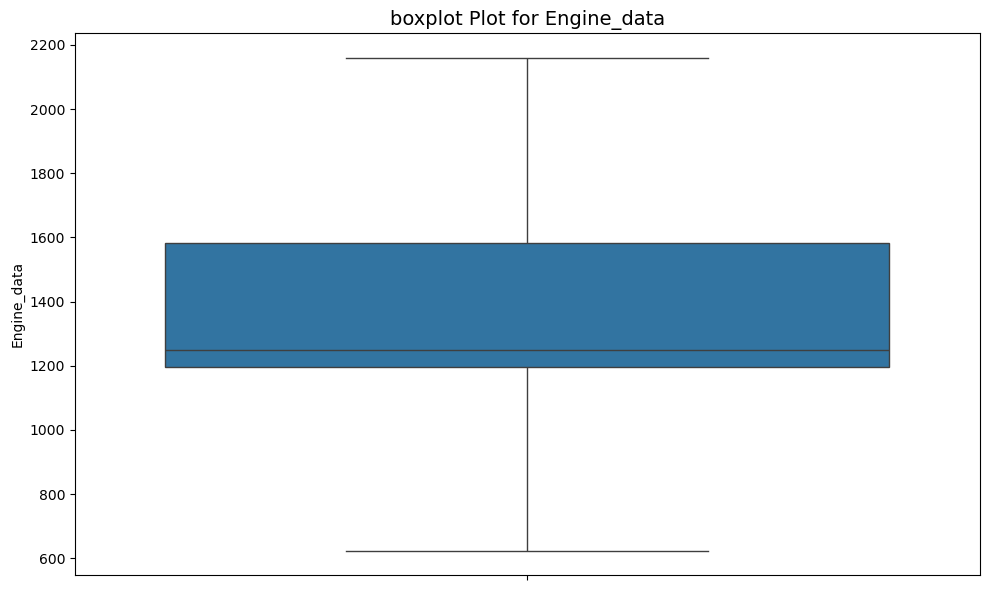

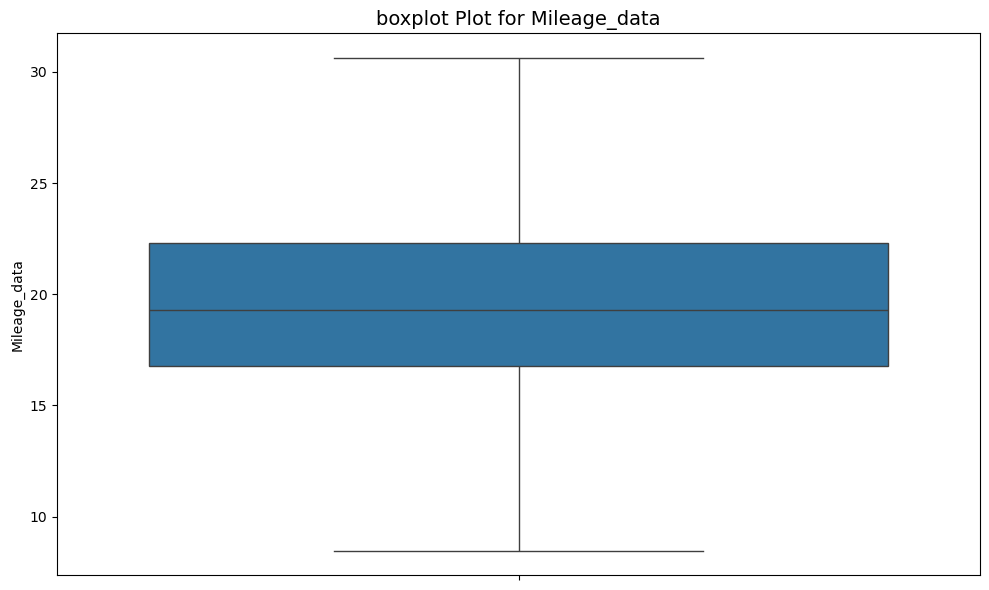

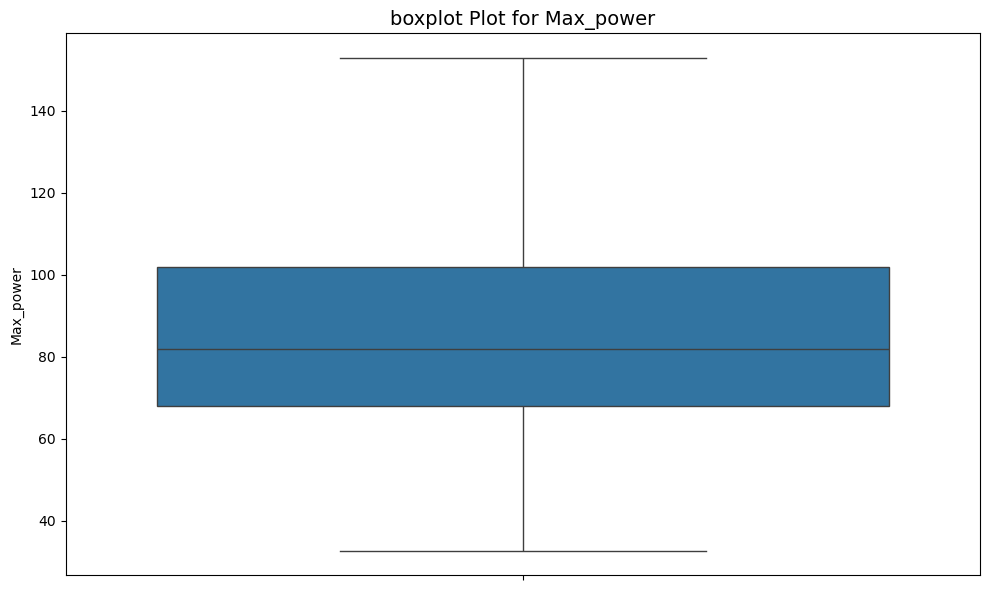

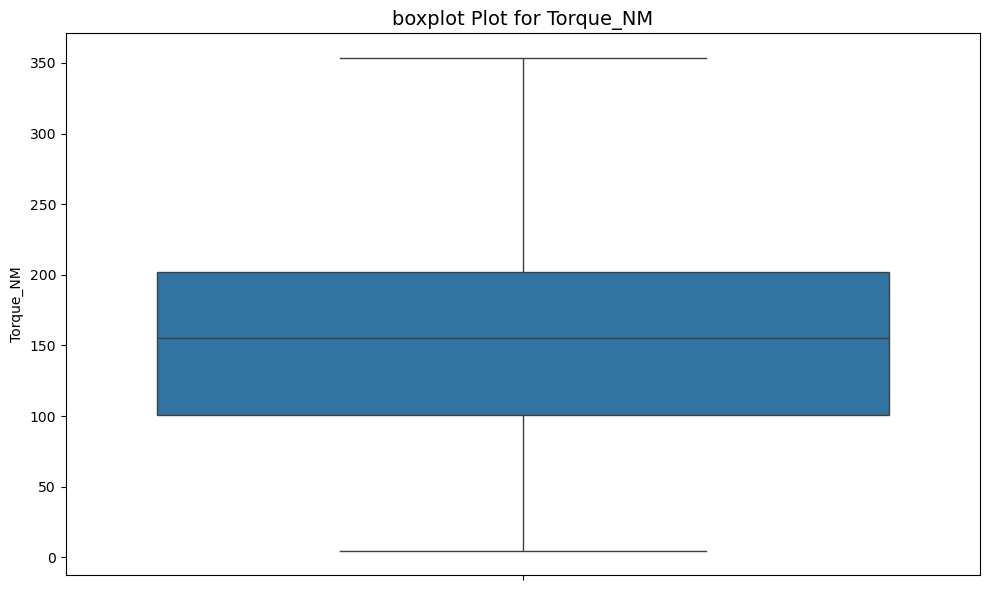

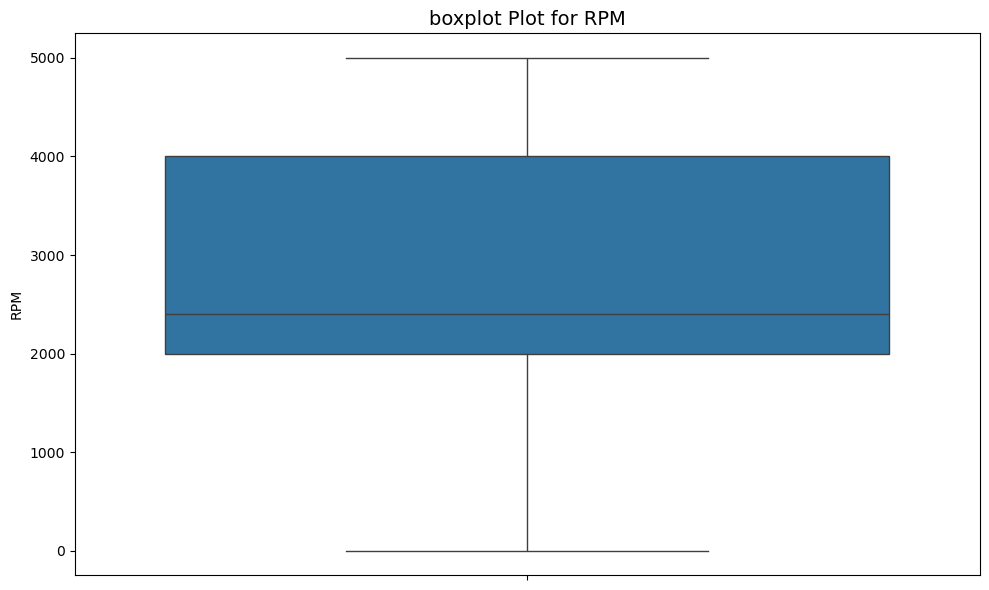

In [296]:
# Loop through each column in the DataFrame
for column in X.columns:
    if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [297]:
# num_X = X.select_dtypes(include=['number'])
# cat_X = X.select_dtypes(exclude=['number'])

In [300]:
# cat_X.head(10)

In [302]:
# cat_encoded = pd.get_dummies(cat_X, drop_first=True,dtype=int)

In [304]:
# cat_encoded.head(10)

In [306]:
# cat_encoded.shape

In [308]:
categorical_columns = X.select_dtypes(include=['object', 'category']).columns
categorical_columns

Index(['fuel', 'seller_type', 'transmission', 'owner', 'Brand', 'model',
       'Mileage_unit'],
      dtype='object')

In [310]:
# X_final = pd.concat([num_X,cat_encoded], axis=1)
X_final = pd.get_dummies(X,columns=['fuel', 'seller_type', 'transmission', 'owner', 'Brand', 'model','Mileage_unit'],dtype=float,drop_first=True)

In [312]:
X_final.sample(10)

year  km_driven  seats  Engine_data  Mileage_data  Max_power  \
5549  2010.0    60000.0    5.0       2159.5         14.00    112.000   
2087  2017.0    30000.0    5.0       2159.5         17.60    152.925   
2505  2008.0    70000.0    5.0        796.0         19.70     46.300   
5918  2013.0    75000.0    5.0        814.0         21.10     55.200   
1102  2013.0    58343.0    5.0        998.0         21.79     67.050   
2575  2017.0    32500.0    5.0       1248.0         28.40     74.020   
6599  2014.0    65000.0    5.0       1498.0         21.14    103.520   
6735  2012.0    97000.0    5.0       1198.0         19.40     86.800   
3150  2013.0    35000.0    5.0       1197.0         20.36     78.900   
3526  2019.0     5621.0    5.0       1197.0         22.00     81.800   

      Torque_NM     RPM  fuel_Diesel  fuel_LPG  fuel_Petrol  \
5549      260.0  2000.0          1.0       0.0          0.0   
2087      353.5  2125.0          1.0       0.0          0.0   
2505       62.0  3000.0          0.0       0.0          1.0   
5918       74.5  4000.0          0.0       0.0          1.0   
1102       90.0  3500.0          0.0       0.0          1.0   
2575      190.0  2000.0          1.0       0.0          0.0   
6599      250.0  2000.0          1.0       0.0          0.0   
6735      109.0  4500.0          0.0       0.0          1.0   
3150      111.8  4000.0          0.0       0.0          1.0   
3526      113.0  4200.0          0.0       0.0          1.0   

      seller_type_Individual  seller_type_Trustmark Dealer  \
5549                     1.0                           0.0   
2087                     1.0                           0.0   
2505                     1.0                           0.0   
5918                     1.0                           0.0   
1102                     0.0                           1.0   
2575                     1.0                           0.0   
6599                     1.0                           0.0   
6735                     1.0                           0.0   
3150                     1.0                           0.0   
3526                     0.0                           1.0   

      transmission_Manual  owner_Fourth & Above Owner  owner_Second Owner  \
5549                  1.0                         0.0                 1.0   
2087                  1.0                         0.0                 0.0   
2505                  1.0                         0.0                 0.0   
5918                  1.0                         0.0                 1.0   
1102                  1.0                         0.0                 0.0   
2575                  1.0                         0.0                 1.0   
6599                  1.0                         0.0                 1.0   
6735                  1.0                         0.0                 1.0   
3150                  1.0                         0.0                 1.0   
3526                  0.0                         0.0                 0.0   

      owner_Test Drive Car  owner_Third Owner  Brand_Ashok  Brand_Audi  \
5549                   0.0                0.0          0.0         0.0   
2087                   0.0                0.0          0.0         0.0   
2505                   0.0                1.0          0.0         0.0   
5918                   0.0                0.0          0.0         0.0   
1102                   0.0                0.0          0.0         0.0   
2575                   0.0                0.0          0.0         0.0   
6599                   0.0                0.0          0.0         0.0   
6735                   0.0                0.0          0.0         0.0   
3150                   0.0                0.0          0.0         0.0   
3526                   0.0                0.0          0.0         0.0   

      Brand_BMW  Brand_Chevrolet  Brand_Daewoo  Brand_Datsun  Brand_Fiat  \
5549        0.0              0.0           0.0           0.0         0.0   
2087        0.0        

In [316]:
X_final['RPM'] = X_final['RPM'].ffill()

In [318]:
from datetime import datetime
current_year = datetime.now().year
X_final['Age'] = current_year - X_final["year"]

In [320]:
X_final = X_final.drop(columns="year")

In [328]:
X_final["Age"].sample(10)

6083    13.0
6976     9.0
4896     8.0
1813    14.0
2542    13.0
4612    20.0
6281     9.0
7397    13.0
1386    10.0
5220     6.0
Name: Age, dtype: float64

In [330]:
X_final.isnull().sum()

km_driven                                              0
seats                                                  0
Engine_data                                            0
Mileage_data                                           0
Max_power                                              0
Torque_NM                                              0
RPM                                                    0
fuel_Diesel                                            0
fuel_LPG                                               0
fuel_Petrol                                            0
seller_type_Individual                                 0
seller_type_Trustmark Dealer                           0
transmission_Manual                                    0
owner_Fourth & Above Owner                             0
owner_Second Owner                                     0
owner_Test Drive Car                                   0
owner_Third Owner                                      0
Brand_Ashok                    

In [332]:
X_final.shape

(7906, 2030)

In [334]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_final,y,test_size=0.2,random_state=42)

In [336]:
X_train.dtypes

km_driven                                              float64
seats                                                  float64
Engine_data                                            float64
Mileage_data                                           float64
Max_power                                              float64
Torque_NM                                              float64
RPM                                                    float64
fuel_Diesel                                            float64
fuel_LPG                                               float64
fuel_Petrol                                            float64
seller_type_Individual                                 float64
seller_type_Trustmark Dealer                           float64
transmission_Manual                                    float64
owner_Fourth & Above Owner                             float64
owner_Second Owner                                     float64
owner_Test Drive Car                                   

In [338]:
X_train.shape , y_train.shape , X_test.shape , y_test.shape

((6324, 2030), (6324,), (1582, 2030), (1582,))

In [340]:
X_train.sample(40)

km_driven  seats  Engine_data  Mileage_data  Max_power  Torque_NM  \
944     15000.0    5.0       1396.0         22.10     88.700     219.70   
5128    66000.0    5.0        796.0         14.70     37.000      62.00   
3860   120000.0    5.0       1248.0         19.30     73.900     190.00   
3794   100000.0    5.0       2159.5         14.80     80.000      19.00   
7105    90000.0    5.0        998.0         20.92     67.100      90.00   
2816    40000.0    5.0       1248.0         26.59     74.000     190.00   
172      9500.0    5.0       1196.0         18.16     86.800     112.00   
2106    40000.0    5.0       2159.5         16.00    138.000     330.00   
7024    29434.0    5.0       1373.0         20.73     91.100     130.00   
4076    30000.0    5.0       1197.0         19.10     82.000     114.00   
274     40000.0    5.0       1198.0         19.02     67.050     104.00   
1455    40000.0    5.0       1248.0         24.30     88.500     200.00   
6641   100000.0    5.0       1799.0         13.50    130.000     172.00   
991     70000.0    5.0       2159.5         15.40    120.000     280.00   
223     75000.0    5.0       1248.0         24.30     88.500     200.00   
1984     2700.0    5.0       1582.0         17.01    126.200     259.90   
5136   125000.0    5.0       1582.0         22.32    126.320     259.80   
5440    35000.0    5.0        998.0         20.30     68.050      94.14   
168     71000.0    5.0       2159.5         12.10    152.925     224.00   
7089    80000.0    5.0       1582.0         22.32    126.320     259.80   
3610    10000.0    5.0        799.0         25.17     53.300      72.00   
5472    77000.0    5.0       1248.0         20.40     91.700     209.00   
4053   110000.0    5.0       1461.0         19.01    108.450     248.00   
2646     7032.0    5.0       1199.0         19.00     88.760     110.00   
5358   120000.0    5.0       1248.0         20.77     88.800     200.00   
1734    50000.0    5.0        796.0         22.74     47.300      69.00   
4660    70000.0    5.0       1405.0         19.40     70.000     135.40   
7676    33033.0    5.0       1198.0         19.40     86.800     109.00   
5795    90000.0    5.0       1968.0         17.20    138.100     320.00   
117     40000.0    5.0       1197.0         20.85     83.140     115.00   
3380   110000.0    5.0       1498.0         24.50     98.600     200.00   
4713    50000.0    5.0       1248.0         24.52     88.500     200.00   
5754    13500.0    5.0       1199.0         23.84     84.000     114.00   
3342   100000.0    5.0       2159.5         13.60     63.000     180.00   
6415    25000.0    5.0       1193.0         16.84     64.400      99.80   
1522    40000.0    5.0       1197.0         18.60     81.830     114.70   
5868   175000.0    5.0       1248.0         21.50     88.800     200.00   
5384    40000.0    5.0       1199.0         20.30     84.000     114.00   
2383    72000.0    5.0       2159.5         13.93    138.030     320.00   
2732   110000.0    5.0       1086.0         19.81     68.050      99.04   

         RPM  fuel_Diesel  fuel_LPG  fuel_Petrol  seller_type_Individual  \
944   2125.0          1.0       0.0          0.0                     1.0   
5128  2500.0          0.0       0.0          1.0                     1.0   
3860  2000.0          1.0       0.0          0.0                     1.0   
3794     1.0          1.0       0.0          0.0                     1.0   
7105  3500.0          0.0       0.0          1.0                     1.0   
2816  2000.0          1.0       0.0          0.0                     1.0   
172   4000.0          0.0       0.0          1.0                     1.0   
2106  2200.0          1.0       0.0          0.0                     1.0   
7024  4000.0          0.0       0.0          1.0                     1.0   
4076  4000.0          0.0       0.0          1.0                     1.0   
274   4000.0          0.0       0.0          1.0                     1.0   
1455  1750.0      

In [342]:
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()

# scaler.fit(X_train)

# X_train_scaled = scaler.transform(X_train)
# X_test_scaled = scaler.transform(X_test)

In [366]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [368]:
model = LinearRegression()

In [370]:
model.fit(X_train,y_train)

LinearRegression()

In [372]:
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

In [374]:
y_pred_train

array([115464.68946838, 514521.96018982, 322883.01823425, ...,
       109999.97866821, 899999.9980011 , 845624.63063049])

In [380]:
r2_test = r2_score(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
print(f'R-squared(test accuracy): {r2_test}')
print(f'R-squared(train accuracy): {r2_train}')

R-squared(test accuracy): -5681242329.847589
R-squared(train accuracy): 0.9891023784500609


In [382]:
from sklearn.linear_model import Ridge

In [384]:
R_clf = Ridge(alpha=1.0)

In [386]:
R_clf.fit(X_train, y_train)

Ridge()

In [388]:
y_pred_r_train = R_clf.predict(X_train)
y_pred_r_test = R_clf.predict(X_test)

In [390]:
score_train = r2_score(y_pred_r_train,y_train)
score_test = r2_score(y_pred_r_test,y_test)
print('Train accuracy : ',score_train," Test accuracy : ",score_test)

Train accuracy :  0.9738471590633611  Test accuracy :  0.968094325534501


In [396]:
from sklearn.model_selection import cross_val_score
# Perform cross-validation and calculate mean R^2 score
r2_scores = cross_val_score(R_clf, X_train, y_train, cv=10, scoring='r2')
print("Mean R^2 Score:", np.mean(r2_scores))

# Display individual R^2 scores
print("R^2 Scores:", r2_scores)

Mean R^2 Score: 0.9349826551118661
R^2 Scores: [0.95927101 0.92747422 0.88476274 0.94391457 0.96651787 0.94841134
 0.96759558 0.85355071 0.95843381 0.9398947 ]


# Lasso_regression

In [399]:
from sklearn.linear_model import Lasso

In [401]:
L_clf = Lasso(alpha=1e-4)

In [403]:
L_clf.fit(X_train,y_train)

C:\Users\parvez\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.253e+13, tolerance: 4.133e+11
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.0001)

In [404]:
y_pred_l_train = L_clf.predict(X_train)
y_pred_l_test = L_clf.predict(X_test)

In [405]:
score_train_l = r2_score(y_pred_l_train,y_train)
score_test_l = r2_score(y_pred_l_test,y_test)
print('Train accuracy : ',score_train_l," Test accuracy : ",score_test_l)

Train accuracy :  0.9889750601969742  Test accuracy :  0.9350627587310916


In [ ]:
# from sklearn.model_selection import cross_val_score
# # Perform cross-validation and calculate mean R^2 score
# r2_scores = cross_val_score(L_clf, X_train, y_train, cv=10, scoring='r2')
# print("Mean R^2 Score:", np.mean(r2_scores))

# # Display individual R^2 scores
# print("R^2 Scores:", r2_scores)